## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
Importing the necessary packages :

In [1]:
import numpy as np
import cv2
import os
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib qt
#import os
#os.listdir("camera_cal/")

## Calibration of Camera and distorsion correction

In [2]:
def calib_undistort(in_img):
    nx = 9
    ny = 6

    # Prepare object points 0,0,0 ... 8,5,0
    objp = np.zeros((ny*nx,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)
    
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Get directory for all calibration images
    images = glob.glob('camera_cal/*.jpg')

    for indx, fname in enumerate(images):
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
    # Test undistortion on img
    img_size = (img.shape[1], img.shape[0])

    # Calibrate camera
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None,None)

    undist = cv2.undistort(in_img, mtx, dist, None, mtx)
    # Save camera calibration for later use
    return undist

Text(0.5,1,'Undistorted Image')

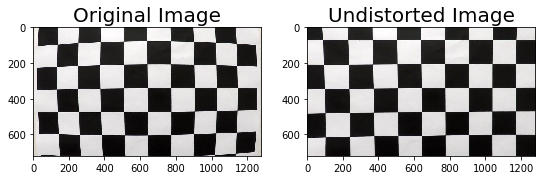

In [3]:
#testing example
img = cv2.imread('camera_cal/calibration1.jpg')
undist = calib_undistort(img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(9,6))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
ax2.set_title('Undistorted Image', fontsize=20)

## Pipeline and Perspective warp

In [4]:
def pipeline(img, s_thresh=(100, 255), sx_thresh=(15, 255)):
    
    img = np.copy(img)
    gray  = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY).astype(np.float) 
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    h_channel = hls[:,:,0]
    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 1) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    combined_binary = np.zeros_like(s_binary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 255
    return combined_binary

def warp_image(img, src, dst):
    ###""" Perspective Transform """
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warp_img = cv2.warpPerspective(img, M, (img.shape[1],img.shape[0]), flags=cv2.INTER_LINEAR)
    return warp_img


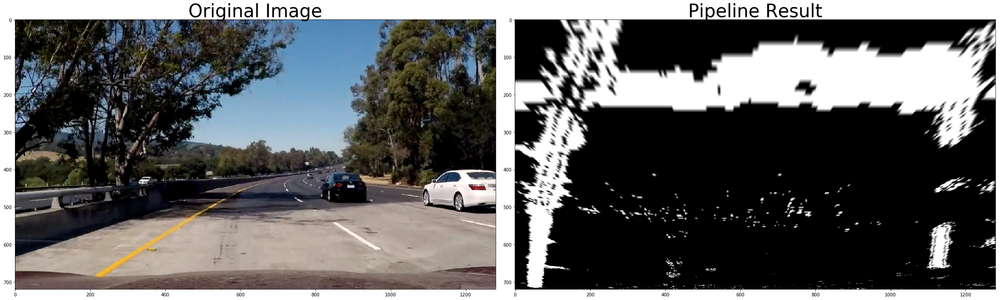

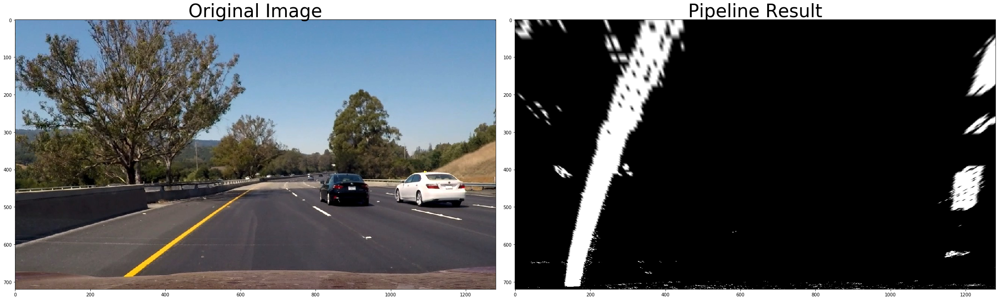

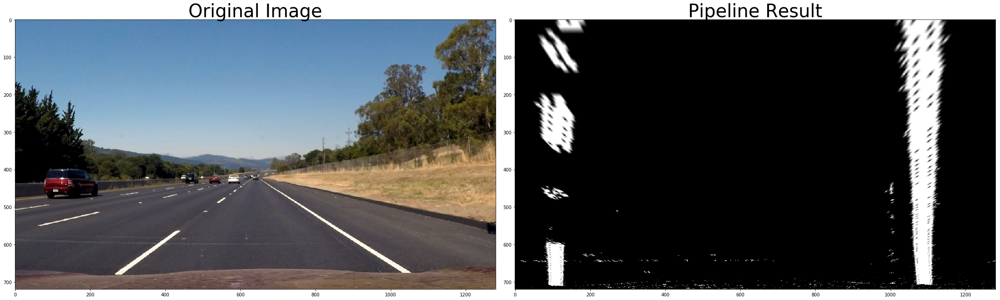

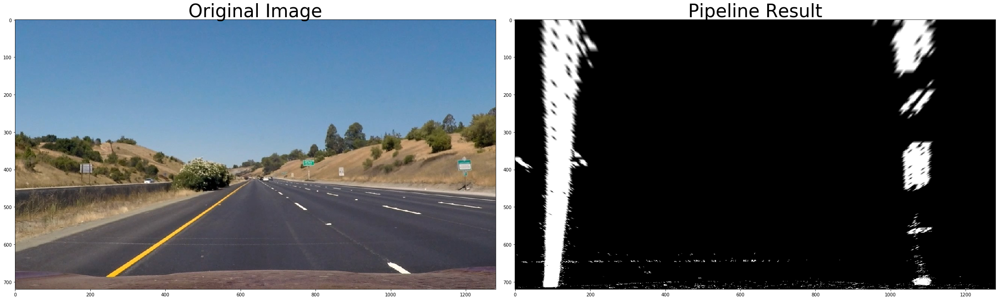

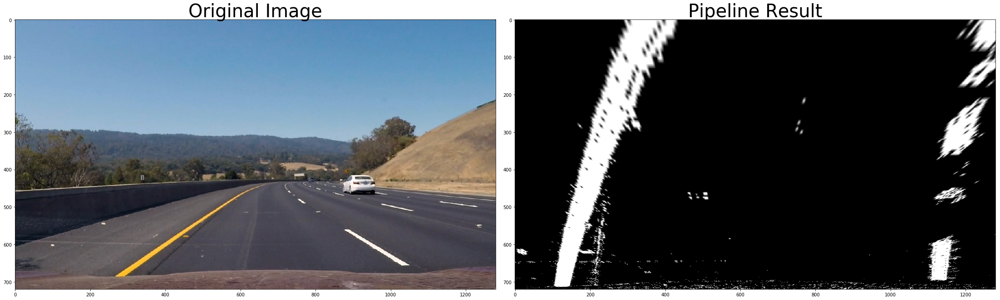

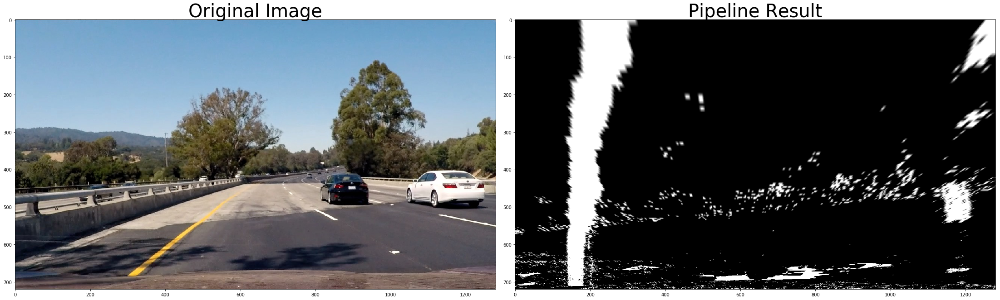

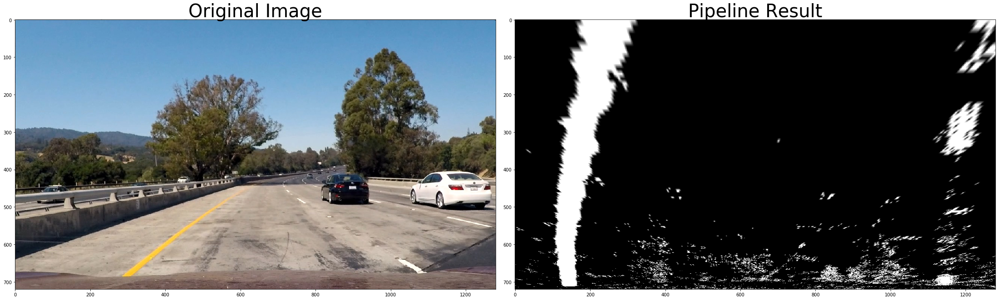

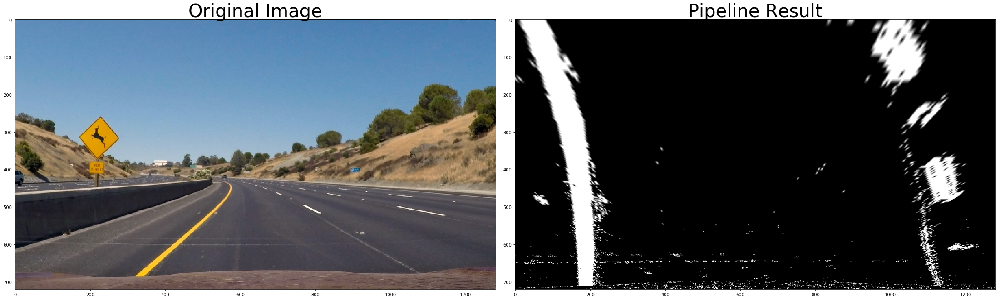

In [5]:
images1 = glob.glob('test_images/*.jpg')

for idx, fname in enumerate(images1):
    image1 = cv2.imread(fname)
    image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
    undist1 = calib_undistort(image1)
    result1 = pipeline(undist1)
    
    src=np.float32([(565,460),(730,460),(120,720),(1280,720)])
    dst=np.float32([(0,0), (1280, 0), (0,720), (1280,720)])
    binary_warped = warp_image(result1, src, dst)
    cv2.imwrite('output_images/test'+str(idx+1)+'.jpg',binary_warped)
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 19))
    f.tight_layout()

    ax1.imshow(image1)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(binary_warped, cmap = 'gray')
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Lane line fitting and radius of curve calculation

In [47]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    # Create empty lists for the rectangles
    rect_coor = []
    

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2)
        rect_coor.append((win_xleft_low,win_y_low, win_xleft_high,win_y_high, win_xright_low,win_y_low,win_xright_high,win_y_high))
     
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    

    return rect_coor, leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    rect_coor, leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    ### TO-DO: Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines

    
    #f, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 19))
    #f.tight_layout()

    #ax1.imshow(binary_warped)
    #ax1.set_title('Warped Image', fontsize=40)

    #ax2.plot(left_fitx, ploty, color='yellow')
    #ax2.plot(right_fitx, ploty, color='yellow')
    #ax2.set_title('Lane lines fit', fontsize=40)
    #plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    return ploty, left_fitx, right_fitx, out_img

def measure_curvature_center(img, ploty, left_fit, right_fit):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    

    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
   
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fit*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fit*xm_per_pix, 2)
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    #Calculation of offset to center
    car_pos = (img.shape[1]/2)* xm_per_pix
    y = img.shape[0] * ym_per_pix
    left_lane_pos = left_fit_cr[0]*y**2 + left_fit_cr[1]*y + left_fit_cr[2]
    right_lane_pos = right_fit_cr[0]*y**2 + right_fit_cr[1]*y + right_fit_cr[2]
    lane_center_pos = (left_lane_pos + right_lane_pos) /2
    offset = (lane_center_pos - car_pos)
    return (left_curverad + right_curverad)/2, offset

def draw_lanes(img, src, dst, ploty, left_fit, right_fit):
    #create holder image for lane lines
    lane_img = np.zeros_like(img)
    #get polynomial points
    left = np.array([np.transpose(np.vstack([left_fit, ploty]))])
    right = np.array([np.flipud(np.transpose(np.vstack([right_fit, ploty])))])
    points = np.hstack((left, right))
    #fill the area between the polynomials
    cv2.fillPoly(lane_img, np.int_(points), (0, 255, 150))
    #unwarp the image of lane lines
    inv_warp_img = warp_image(lane_img, dst, src)
    #add the lanes to the original image
    inv_warp_img = cv2.addWeighted(img, 1, inv_warp_img, 0.7, 0)
    radius, offset = measure_curvature_center(img, ploty, left_fit, right_fit)
    cv2.putText(inv_warp_img,"Radius of curvature = " + str(int(radius))+ " m", (50, 50), cv2.FONT_HERSHEY_PLAIN, 4, (255,255,255),2)
    if (offset<0):
        cv2.putText(inv_warp_img,"Vehicle is {0:.{1}f} m left of center".format(abs(offset), 3), (50, 150), cv2.FONT_HERSHEY_PLAIN, 4, (255,255,255),2)
    if (offset>0):
        cv2.putText(inv_warp_img,"Vehicle is {0:.{1}f} m right of center".format(abs(offset), 3), (50, 150), cv2.FONT_HERSHEY_PLAIN, 4, (255,255,255),2)

    return inv_warp_img

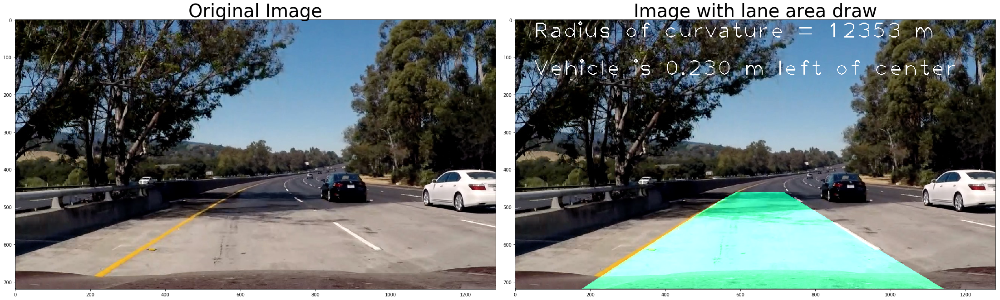

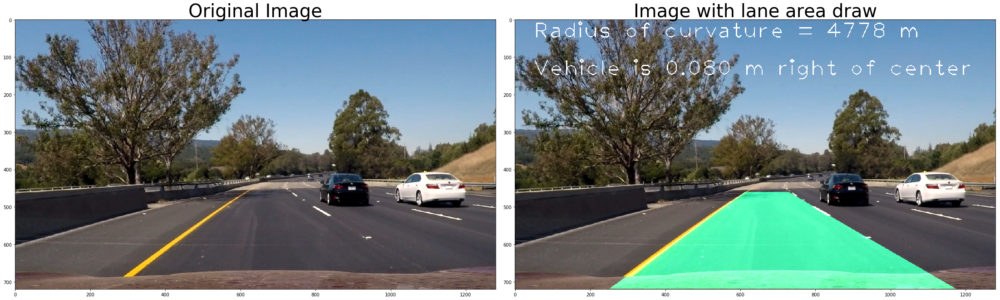

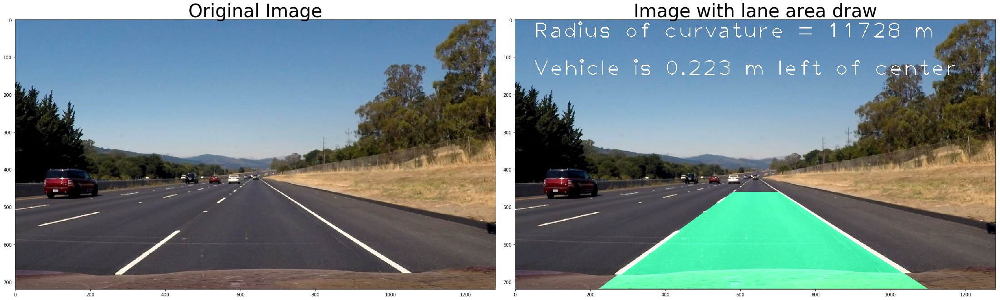

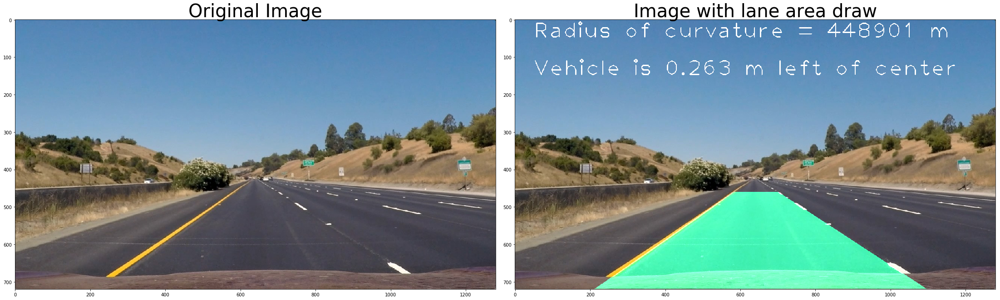

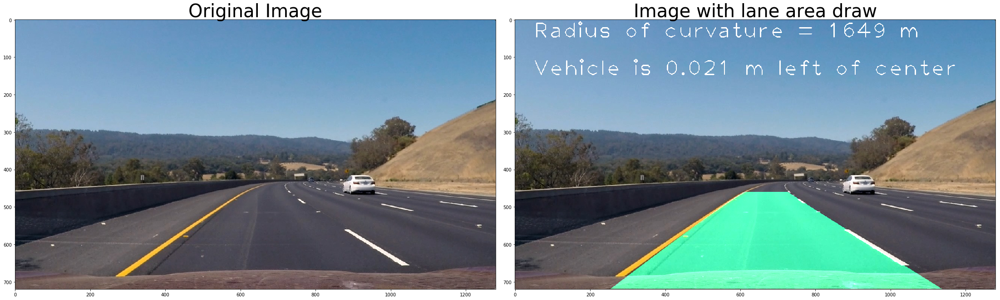

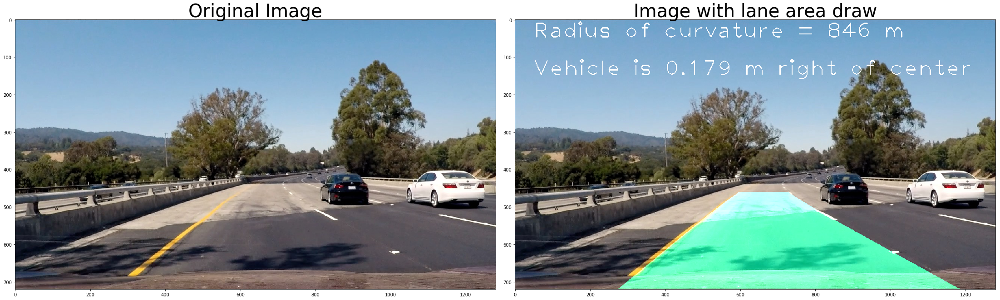

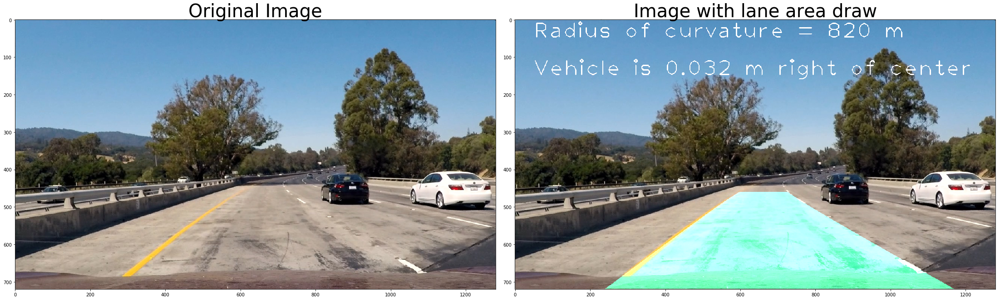

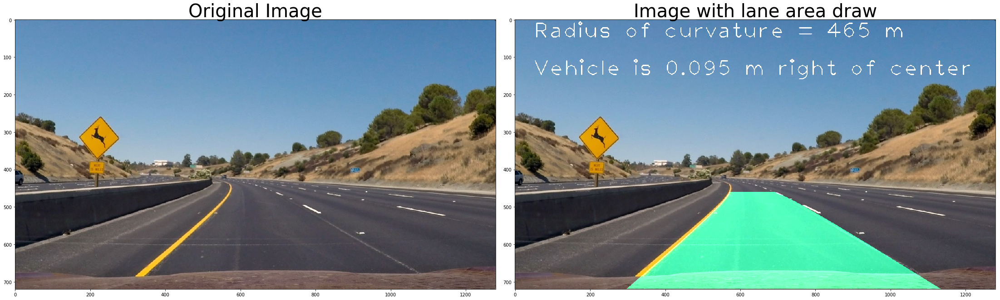

In [48]:
images2 = glob.glob('test_images/*.jpg')

for idx, fname in enumerate(images2):

    image2 = cv2.imread(fname)
    image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
    undist2 = calib_undistort(image2)
    result2 = pipeline(undist2)
    
    src=np.float32([(565,460),(730,460),(120,720),(1280,720)])
    dst=np.float32([(0,0), (1280, 0), (0,720), (1280,720)])
    binary_warped2 = warp_image(result2, src, dst)
    ploty, left_fit, right_fit, windowed_img = fit_polynomial(binary_warped2)
    img_with_lanes = draw_lanes(image2, src, dst, ploty, left_fit, right_fit)
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 19))
    f.tight_layout()

    ax1.imshow(image2)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(img_with_lanes)
    ax2.set_title('Image with lane area draw', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

   

## Full processing pipeline

In [58]:
def process_image(image2):
    undist2 = calib_undistort(image2)
    result2 = pipeline(undist2)
    src=np.float32([(565,460),(730,460),(120,720),(1280,720)])
    dst=np.float32([(0,0), (1280, 0), (0,720), (1280,720)])
    binary_warped2 = warp_image(result2, src, dst)
    ploty, left_fit, right_fit, windowed_img = fit_polynomial(binary_warped2)
    img_with_lanes = draw_lanes(image2, src, dst, ploty, left_fit, right_fit)
    return img_with_lanes

## Video processing

In [59]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [61]:
white_output = 'output_project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
clip1 = VideoFileClip("project_video.mp4").subclip(0,5)
#clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video output_project_video.mp4
[MoviePy] Writing video output_project_video.mp4



 99%|█████████▉| 125/126 [08:35<00:04,  4.12s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_project_video.mp4 

CPU times: user 8min 19s, sys: 874 ms, total: 8min 20s
Wall time: 8min 38s
